In [1]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LassoCV, ElasticNetCV
from sklearn.model_selection import KFold, train_test_split, cross_val_score
from sklearn.pipeline import make_pipeline
from statsmodels.stats.diagnostic import linear_reset, het_breuschpagan as bptest
from statsmodels.stats.outliers_influence import OLSInfluence, variance_inflation_factor
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statsmodels.stats.anova import anova_lm
from scipy.stats import t
from patsy import dmatrix
import rpowertransform
from rpowertransform.multivariate import MultivariatePowerTransform

salaries = pd.read_csv(r"C:\Users\tariq\Desktop\Python and R Buda 1\Salaries.csv")
print(salaries.head())

       rank discipline  yrs.since.phd  yrs.service   sex  salary
0      Prof          B             19           18  Male  139750
1      Prof          B             20           16  Male  173200
2  AsstProf          B              4            3  Male   79750
3      Prof          B             45           39  Male  115000
4      Prof          B             40           41  Male  141500


In [2]:
print(salaries.describe(include = 'all'))

        rank discipline  yrs.since.phd  yrs.service   sex         salary
count    397        397     397.000000   397.000000   397     397.000000
unique     3          2            NaN          NaN     2            NaN
top     Prof          B            NaN          NaN  Male            NaN
freq     266        216            NaN          NaN   358            NaN
mean     NaN        NaN      22.314861    17.614610   NaN  113706.458438
std      NaN        NaN      12.887003    13.006024   NaN   30289.038695
min      NaN        NaN       1.000000     0.000000   NaN   57800.000000
25%      NaN        NaN      12.000000     7.000000   NaN   91000.000000
50%      NaN        NaN      21.000000    16.000000   NaN  107300.000000
75%      NaN        NaN      32.000000    27.000000   NaN  134185.000000
max      NaN        NaN      56.000000    60.000000   NaN  231545.000000


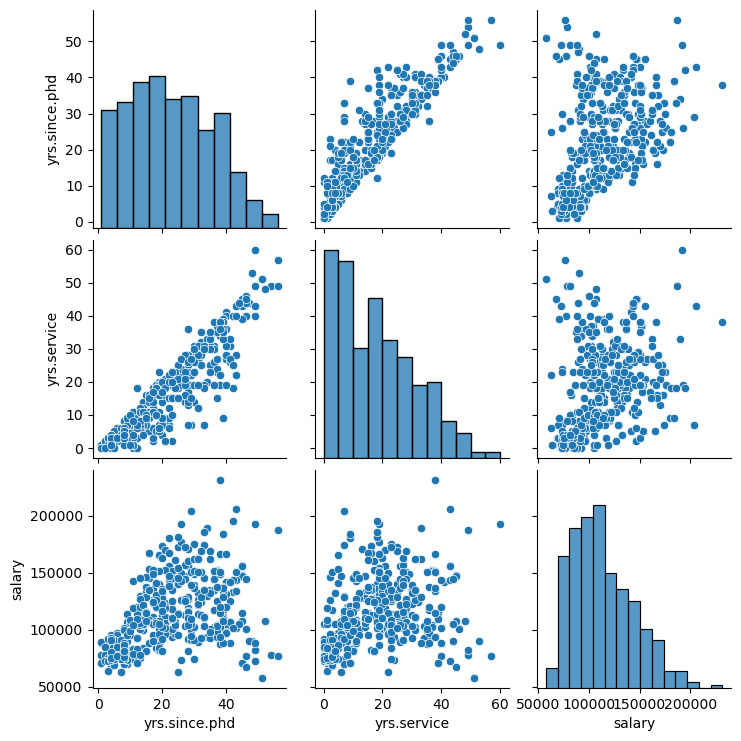

In [3]:
sns.pairplot(salaries)
plt.show()

In [4]:
cols =  salaries.select_dtypes(include = "object").columns
salaries[cols] = salaries[cols].astype("category")
salaries["yrs_service_plus"] = salaries["yrs.service"] + 0.1
salaries["salary_inv_sqrt"] = 1/np.sqrt(salaries["salary"])
salaries = salaries.rename(columns = {"yrs.service": "yrs_service",
                                      "yrs.since.phd": "yrs_since_phd"})
print(salaries.dtypes)

rank                category
discipline          category
yrs_since_phd          int64
yrs_service            int64
sex                 category
salary                 int64
yrs_service_plus     float64
salary_inv_sqrt      float64
dtype: object


In [5]:
means = salaries.groupby("sex", observed = True)["salary"].mean()
original_difference = means.iloc[1] - means.iloc[0]
print(means)
print("Original Difference:", original_difference)

sex
Female    101002.410256
Male      115090.418994
Name: salary, dtype: float64
Original Difference: 14088.008738003162


In [6]:
stats = scipy.stats.ttest_ind(salaries["salary"][salaries["sex"] == "Male"], salaries["salary"][salaries["sex"] == "Female"], equal_var = False, alternative = "greater" )
print(f"Statistic:{stats.statistic}",
      f"P-value:{stats.pvalue}",
      f"df:{stats.df}")

Statistic:3.161474091674088 P-value:0.0013318089699819967 df:50.1215153351517


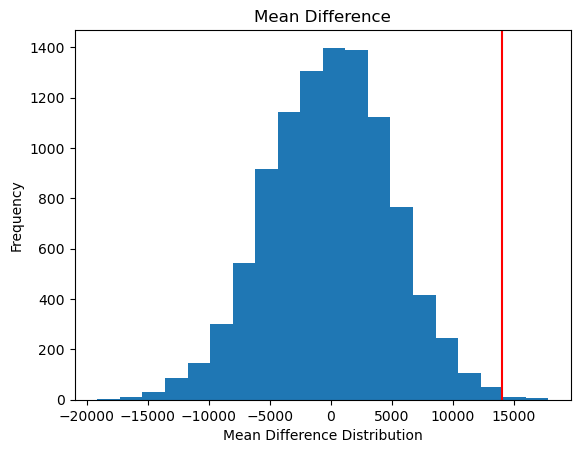

In [7]:
boots = []

for i in range(0, 10000):
    new_salary = np.random.choice(salaries["salary"], salaries.shape[0], replace = False)
    salaries_df = pd.DataFrame({"sex": salaries["sex"], "salary": new_salary})
    new_means = salaries_df.groupby("sex", observed = True)["salary"].mean()
    differences = new_means.iloc[1] - new_means.iloc[0]
    boots.append(differences)


plt.figure()
plt.hist(boots, bins = 20)
plt.axvline(original_difference, color = 'red')
plt.xlabel("Mean Difference Distribution")
plt.ylabel("Frequency")
plt.title("Mean Difference")
plt.show()

In [8]:
pvalue = original_difference < boots
print(sum(pvalue)/10000)

0.0017


In [9]:
salariesfit = smf.ols("salary~C(sex)+C(rank)+C(discipline)+(yrs_service)+(yrs_since_phd)", data = salaries).fit()
print(salariesfit.summary())

                            OLS Regression Results                            
Dep. Variable:                 salary   R-squared:                       0.455
Model:                            OLS   Adj. R-squared:                  0.446
Method:                 Least Squares   F-statistic:                     54.20
Date:                Fri, 12 Dec 2025   Prob (F-statistic):           1.79e-48
Time:                        20:23:42   Log-Likelihood:                -4538.9
No. Observations:                 397   AIC:                             9092.
Df Residuals:                     390   BIC:                             9120.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept            7.886e+04   4

In [10]:
print(anova_lm(salariesfit, type = 2))

                  df        sum_sq       mean_sq           F        PR(>F)
C(sex)           1.0  6.980015e+09  6.980015e+09   13.740441  2.402632e-04
C(rank)          2.0  1.370926e+11  6.854628e+10  134.936127  2.903516e-45
C(discipline)    1.0  1.828318e+10  1.828318e+10   35.991185  4.528311e-09
yrs_service      1.0  3.244823e+08  3.244823e+08    0.638757  4.246479e-01
yrs_since_phd    1.0  2.504061e+09  2.504061e+09    4.929345  2.697855e-02
Residual       390.0  1.981163e+11  5.079906e+08         NaN           NaN


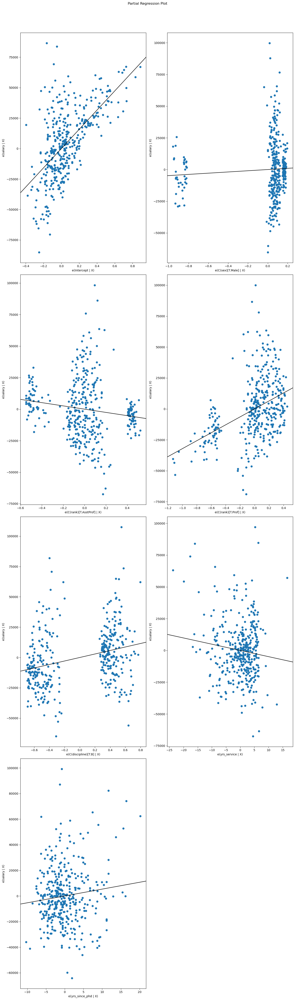

In [11]:
fig = sm.graphics.plot_partregress_grid(salariesfit, fig = plt.figure(figsize = (14, 48)))
plt.show()

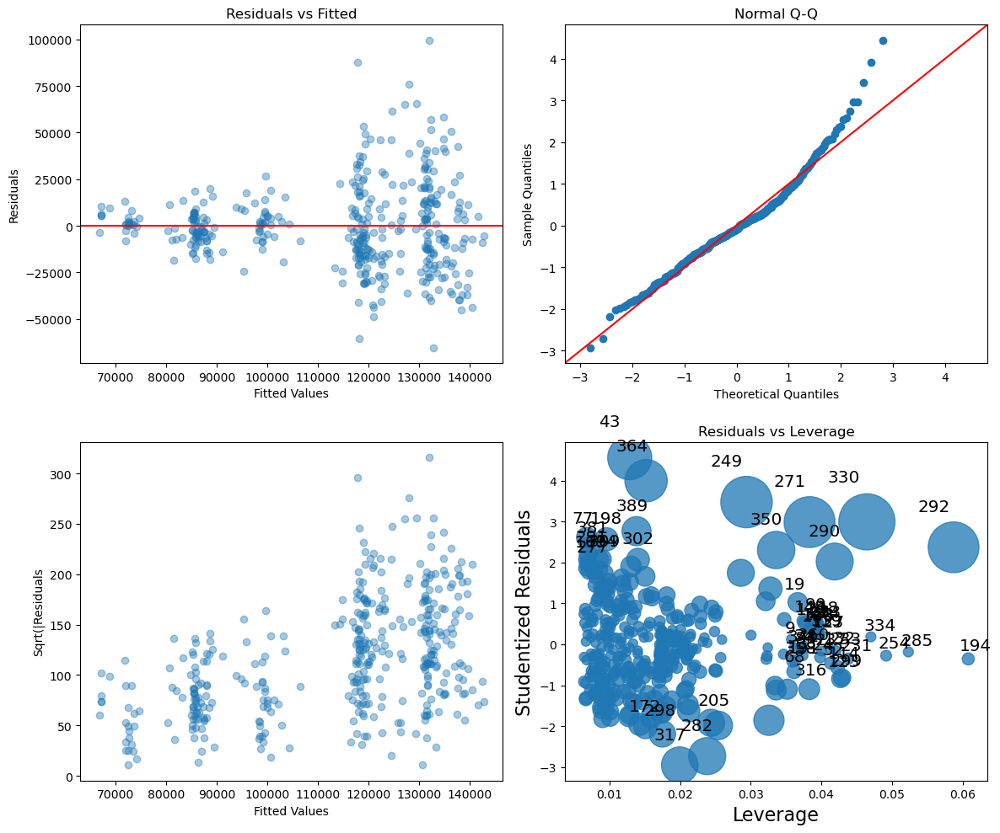

In [12]:
fig, axes = plt.subplots(2,2, figsize = (12,10))

axes[0,0].scatter(salariesfit.fittedvalues, salariesfit.resid, alpha = 0.4)
axes[0,0].axhline(0, color = 'red')
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Residuals")
axes[0,0].set_title("Residuals vs Fitted")
sm.qqplot(salariesfit.get_influence().resid_studentized_internal, line = '45', ax = axes[0,1])
axes[0,1].set_title("Normal Q-Q")
axes[1,0].scatter(salariesfit.fittedvalues, np.sqrt(np.abs(salariesfit.resid)), alpha = 0.4)
axes[1,0].set_xlabel("Fitted Values")
axes[1,0].set_ylabel("Sqrt(|Residuals")
sm.graphics.influence_plot(salariesfit, ax = axes[1,1], criterion = "cooks")
axes[1,1].set_title("Residuals vs Leverage")
plt.tight_layout()
plt.show()

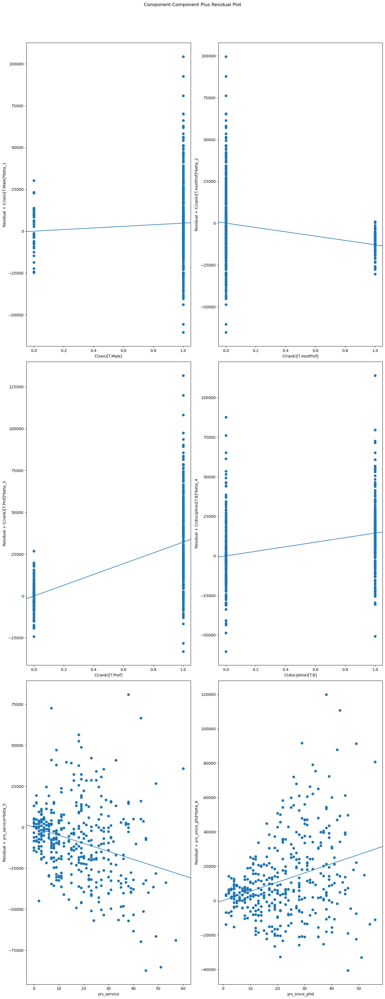

<F test: F=4.383629742737657, p=0.0017736624248677782, df_denom=386, df_num=4>
<F test: F=832.1924240464535, p=5.390550405446339e-142, df_denom=393, df_num=2>


In [13]:
fig = sm.graphics.plot_ccpr_grid(salariesfit, fig = plt.figure(figsize = (14, 48)))
plt.show()

print(linear_reset(salariesfit, power = [2, 3], test_type = 'exog', use_f = True))
print(linear_reset(salariesfit, power = [2, 3], test_type = 'fitted', use_f = True))

In [14]:
salariesbp = bptest(salariesfit.resid, salariesfit.model.exog)

labels = ["BP statistics", "BP p-value", "f-value", "f p-value"]

for stat, score in zip(labels, salariesbp):
    print(f"{stat}:{score}")

BP statistics:65.05461165898144
BP p-value:4.204594008352198e-12
f-value:12.73869108098488
f p-value:3.8116505941127605e-13


In [15]:
X = salariesfit.model.exog
vif = pd.DataFrame({"Variables": salariesfit.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})
print(vif[vif["VIF"] >= 10])

   Variables       VIF
0  Intercept  19.46223


In [16]:
rstudent = OLSInfluence(salariesfit).resid_studentized_external
df = salariesfit.df_resid
pval = 2 * (1 - t.cdf(np.abs(rstudent), df))
bonf_pval = np.minimum(pval * len(pval), 1.0)
outlier_table = pd.DataFrame({"rstudent": rstudent, "unadjusted p-value": pval, "Bonferri p-value": bonf_pval})
outlier_table = outlier_table.sort_values("Bonferri p-value").head(10)
outlier_table

,rstudent,unadjusted p-value,Bonferri p-value
43,4.558843,0.000007,0.002737
364,3.997249,0.000077,0.030427
249,3.475788,0.000567,0.224949
269,-0.698826,0.485077,1.000000
268,-1.332820,0.183369,1.000000
267,-0.627683,0.530579,1.000000
266,1.170903,0.242353,1.000000
265,0.641679,0.521459,1.000000
264,-0.867657,0.386115,1.000000
263,0.391198,0.695864,1.000000


In [69]:
print(salariesfit.get_influence().summary_frame()[["hat_diag", "cooks_d", "standard_resid"]].sort_values("cooks_d", ascending = False).head(10))

     hat_diag   cooks_d  standard_resid
330  0.046459  0.061054        2.961704
249  0.029414  0.050858        3.427437
271  0.038345  0.049773        2.955987
292  0.058737  0.049513        2.356717
43   0.012872  0.036845        4.447439
364  0.015187  0.033898        3.922634
350  0.033612  0.026079        2.290992
282  0.023839  0.025605       -2.709106
290  0.041899  0.025378        2.015508
317  0.019960  0.024880       -2.924262


In [17]:
df = salaries.copy()
df = df.drop(columns = ['yrs_service', 'salary_inv_sqrt'])
mpt = MultivariatePowerTransform(family = 'box-cox')
mpt.fit_transform(Y = df.select_dtypes(include = ['int64', 'float64']))
labels = df.select_dtypes(include = ['int64', 'float64']).columns

for lab, score in zip(labels, mpt.lambdas_):
    print(f"{lab}:{score}")

yrs_since_phd:0.5852696937057341
salary:-0.24986906433264486
yrs_service_plus:0.5239529274340031


In [18]:
salarynew = smf.ols("I(salary**-0.25)~C(rank)*C(discipline)*C(sex)*I(yrs_service_plus**0.52)*I(yrs_since_phd**0.59)", data = salaries).fit()
print(salarynew.summary())

                            OLS Regression Results                            
Dep. Variable:     I(salary ** -0.25)   R-squared:                       0.622
Model:                            OLS   Adj. R-squared:                  0.571
Method:                 Least Squares   F-statistic:                     12.23
Date:                Fri, 12 Dec 2025   Prob (F-statistic):           9.08e-50
Time:                        20:23:47   Log-Likelihood:                 1868.2
No. Observations:                 397   AIC:                            -3640.
Df Residuals:                     349   BIC:                            -3449.
Df Model:                          47                                         
Covariance Type:            nonrobust                                         
                                                                                                                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

In [19]:
print(anova_lm(salarynew, type = 3))

                                                       df        sum_sq  \
C(rank)                                               2.0  2.343058e-03   
C(discipline)                                         1.0  3.233068e-04   
C(sex)                                                1.0  1.133613e-05   
C(rank):C(discipline)                                 2.0  2.356774e-05   
C(rank):C(sex)                                        2.0  4.930984e-06   
C(discipline):C(sex)                                  1.0  8.834408e-06   
C(rank):C(discipline):C(sex)                          2.0  3.478592e-06   
I(yrs_service_plus ** 0.52)                           1.0  1.442564e-05   
C(rank):I(yrs_service_plus ** 0.52)                   2.0  1.123814e-05   
C(discipline):I(yrs_service_plus ** 0.52)             1.0  3.379676e-05   
C(sex):I(yrs_service_plus ** 0.52)                    1.0  9.848361e-06   
C(rank):C(discipline):I(yrs_service_plus ** 0.52)     2.0  1.655980e-06   
C(rank):C(sex):I(yrs_serv

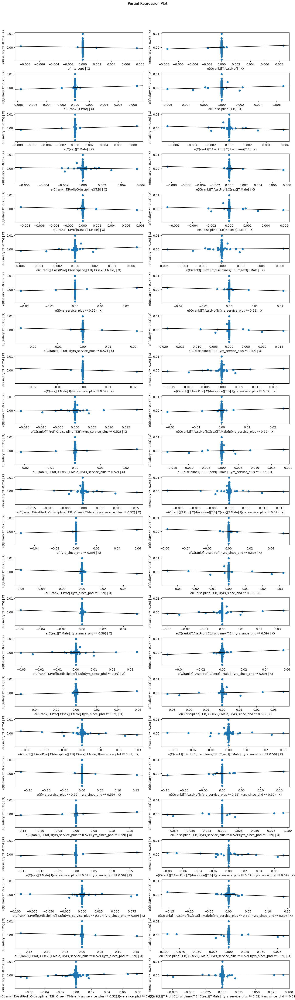

In [20]:
fig = sm.graphics.plot_partregress_grid(salarynew, fig = plt.figure(figsize = (14, 48)))
plt.show()

C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:847: RuntimeWarning: invalid value encountered in sqrt
  return self.resid / sigma / np.sqrt(1 - hii)


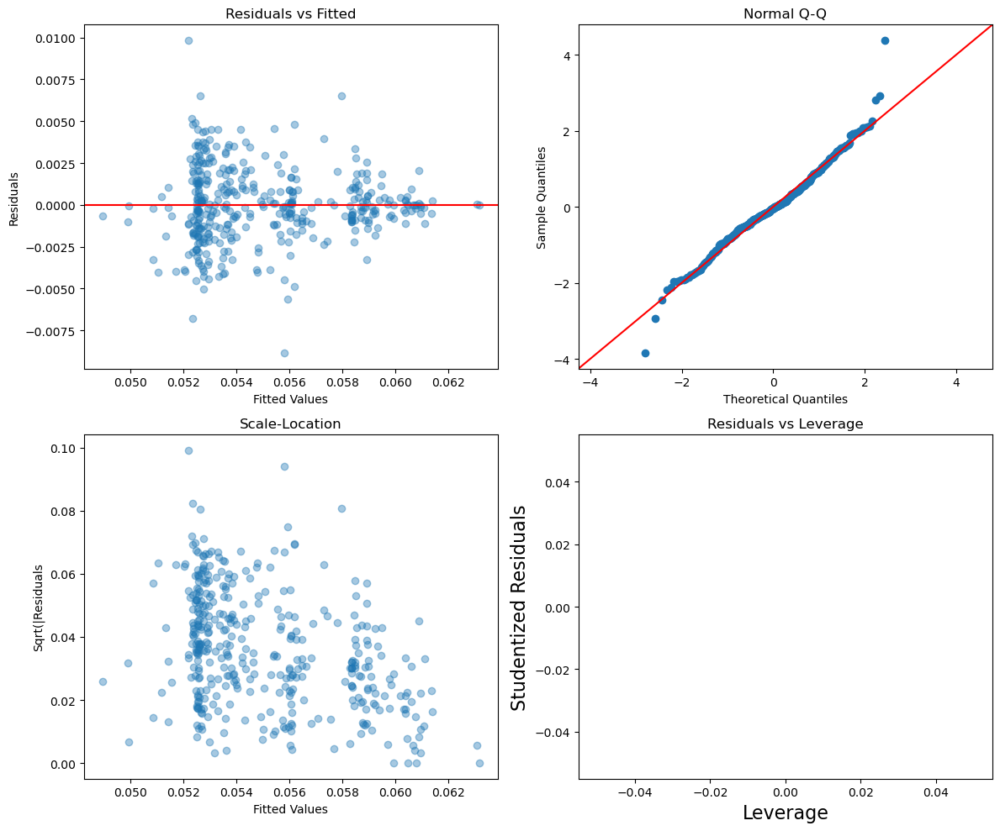

In [21]:
fig, axes = plt.subplots(2,2, figsize = (12, 10))

axes[0,0].scatter(salarynew.fittedvalues, salarynew.resid, alpha = 0.4)
axes[0,0].axhline(0, color = 'red')
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Residuals")
axes[0,0].set_title("Residuals vs Fitted")
sm.qqplot(salarynew.get_influence().resid_studentized_internal, line = '45', ax = axes[0,1])
axes[0,1].set_title("Normal Q-Q")
axes[1,0].scatter(salarynew.fittedvalues, np.sqrt(np.abs(salarynew.resid)), alpha = 0.4)
axes[1,0].set_xlabel("Fitted Values")
axes[1,0].set_ylabel("Sqrt(|Residuals")
axes[1,0].set_title("Scale-Location")
sm.graphics.influence_plot(salarynew, ax = axes[1,1], criterion = 'cooks')
axes[1,1].set_title("Residuals vs Leverage")
plt.tight_layout()
plt.show()

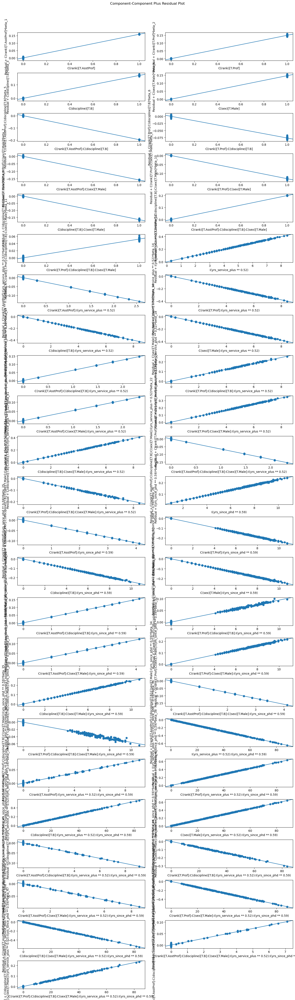

<F test: F=np.float64(13.028057456055194), p=1.8730677264972889e-56, df_denom=299, df_num=64>
<F test: F=1.8507176160750127, p=0.15867193858240186, df_denom=347, df_num=2>


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 72, but rank is 64
  warnings.warn('covariance of constraints does not have full '


In [22]:
fig = sm.graphics.plot_ccpr_grid(salarynew, fig = plt.figure(figsize = (14, 48)))
plt.show()

print(linear_reset(salarynew, power = [2,3], test_type = 'exog', use_f = True))
print(linear_reset(salarynew, power = [2,3], test_type = 'fitted', use_f = True))

In [23]:
salarynewbp = bptest(salarynew.resid, salarynew.model.exog)

labels = ["BP statistic", "BP p-value", "f-value", "f p-value"]

for stat, score in zip(labels, salarynewbp):
    print(f"{stat}:{score}")

BP statistic:68.83454166138478
BP p-value:0.02059207641504212
f-value:1.557546880593014
f p-value:0.014477149295028729


In [24]:
X = salarynew.model.exog
vif = pd.DataFrame({"Variable": salarynew.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})
print(vif[vif["VIF"] >= 10])

                                             Variable           VIF
0                                           Intercept  2.948881e+06
1                                 C(rank)[T.AsstProf]  4.144626e+05
2                                     C(rank)[T.Prof]  6.530365e+05
3                                  C(discipline)[T.B]  9.302029e+05
4                                      C(sex)[T.Male]  2.614186e+05
5              C(rank)[T.AsstProf]:C(discipline)[T.B]  3.673588e+05
6                  C(rank)[T.Prof]:C(discipline)[T.B]  8.940809e+05
7                  C(rank)[T.AsstProf]:C(sex)[T.Male]  3.586221e+05
8                      C(rank)[T.Prof]:C(sex)[T.Male]  6.932093e+05
9                   C(discipline)[T.B]:C(sex)[T.Male]  9.380637e+05
10  C(rank)[T.AsstProf]:C(discipline)[T.B]:C(sex)[...  3.298505e+05
11  C(rank)[T.Prof]:C(discipline)[T.B]:C(sex)[T.Male]  8.605818e+05
12                        I(yrs_service_plus ** 0.52)  1.166680e+06
13    C(rank)[T.AsstProf]:I(yrs_service_plus ** 

In [25]:
rstudent = OLSInfluence(salarynew).resid_studentized_external
df = salarynew.df_resid
pval = 2 * (1 - t.cdf(np.abs(rstudent), df))
bonf_pval = np.minimum(pval * len(pval), 1.0)
outlier_table = pd.DataFrame({"rstudent": rstudent, "unadjusted p-value": pval, "Bonferri p-value": bonf_pval})
outlier_table = outlier_table.sort_values("Bonferri p-value").head(10)
outlier_table

C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:847: RuntimeWarning: invalid value encountered in sqrt
  return self.resid / sigma / np.sqrt(1 - hii)


,rstudent,unadjusted p-value,Bonferri p-value
317,4.498941,0.000009,0.003698
364,-3.925572,0.000104,0.041388
0,-0.372637,0.709645,1.000000
269,-0.338001,0.735566,1.000000
268,0.672870,0.501475,1.000000
267,-0.057392,0.954266,1.000000
266,-1.954567,0.051432,1.000000
265,-0.617480,0.537321,1.000000
264,0.877453,0.380844,1.000000
263,-0.342034,0.732531,1.000000


In [71]:
print(salarynew.get_influence().summary_frame()[["hat_diag", "cooks_d", "standard_resid"]].sort_values("cooks_d").head(10))

C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:847: RuntimeWarning: invalid value encountered in sqrt
  return self.resid / sigma / np.sqrt(1 - hii)
C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:888: RuntimeWarning: invalid value encountered in sqrt
  dffits_ = self.resid_studentized_internal * np.sqrt(hii / (1 - hii))


     hat_diag       cooks_d  standard_resid
384  0.013441  5.161113e-09       -0.004264
115  0.029501  3.052129e-08        0.006942
118  0.107558  5.980572e-08       -0.004880
39   0.056131  8.215732e-08        0.008143
250  0.018708  2.244719e-07        0.023773
168  0.072288  2.924648e-07        0.013422
167  0.023843  4.313519e-07        0.029115
307  0.015243  5.144701e-07       -0.039942
119  0.336775  6.816091e-07        0.008027
338  0.014980  8.065511e-07        0.050455


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:917: RuntimeWarning: invalid value encountered in sqrt
  dffits_ = self.resid_studentized_external * np.sqrt(hii / (1 - hii))


In [26]:
salarysqrt = smf.ols("salary_inv_sqrt~C(rank)*C(discipline)*C(sex)*np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)", data = salaries).fit()
print(salarysqrt.summary())

                            OLS Regression Results                            
Dep. Variable:        salary_inv_sqrt   R-squared:                       0.635
Model:                            OLS   Adj. R-squared:                  0.586
Method:                 Least Squares   F-statistic:                     12.93
Date:                Fri, 12 Dec 2025   Prob (F-statistic):           3.22e-52
Time:                        20:24:05   Log-Likelihood:                 2751.0
No. Observations:                 397   AIC:                            -5406.
Df Residuals:                     349   BIC:                            -5215.
Df Model:                          47                                         
Covariance Type:            nonrobust                                         
                                                                                                        coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------

In [27]:
print(anova_lm(salarysqrt, type = 3))

                                                       df        sum_sq  \
C(rank)                                               2.0  2.901812e-05   
C(discipline)                                         1.0  4.066792e-06   
C(sex)                                                1.0  1.450014e-07   
C(rank):C(discipline)                                 2.0  3.681650e-07   
C(rank):C(sex)                                        2.0  7.535188e-08   
C(discipline):C(sex)                                  1.0  1.131657e-07   
C(rank):C(discipline):C(sex)                          2.0  4.956094e-08   
np.sqrt(yrs_service)                                  1.0  2.060448e-07   
C(rank):np.sqrt(yrs_service)                          2.0  1.465893e-07   
C(discipline):np.sqrt(yrs_service)                    1.0  3.890810e-07   
C(sex):np.sqrt(yrs_service)                           1.0  1.207951e-07   
C(rank):C(discipline):np.sqrt(yrs_service)            2.0  1.295918e-08   
C(rank):C(sex):np.sqrt(yr

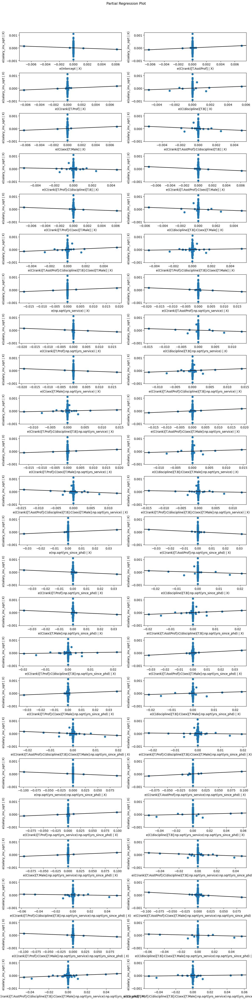

In [28]:
fig = sm.graphics.plot_partregress_grid(salarysqrt, fig = plt.figure(figsize = (12,48)))
plt.show()

C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:847: RuntimeWarning: invalid value encountered in sqrt
  return self.resid / sigma / np.sqrt(1 - hii)


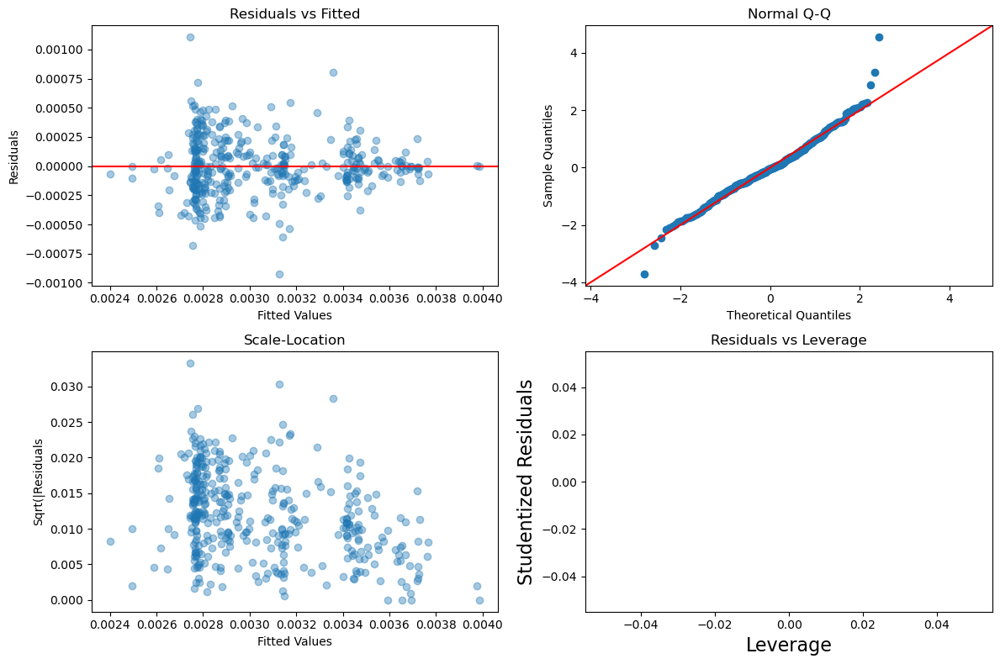

In [29]:
fig, axes = plt.subplots(2,2, figsize = (12,8))

axes[0,0].scatter(salarysqrt.fittedvalues, salarysqrt.resid, alpha = 0.4)
axes[0,0].axhline(0, color = 'red')
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Residuals")
axes[0,0].set_title("Residuals vs Fitted")
sm.graphics.qqplot(salarysqrt.get_influence().resid_studentized_internal, line = '45', ax = axes[0,1])
axes[0,1].set_title("Normal Q-Q")
axes[1,0].scatter(salarysqrt.fittedvalues, np.sqrt(np.abs(salarysqrt.resid)), alpha = 0.4)
axes[1,0].set_xlabel("Fitted Values")
axes[1,0].set_ylabel("Sqrt(|Residuals")
axes[1,0].set_title("Scale-Location")
sm.graphics.influence_plot(salarysqrt, ax = axes[1,1], criterion = 'cooks')
axes[1,1].set_title("Residuals vs Leverage")
plt.tight_layout()
plt.show()

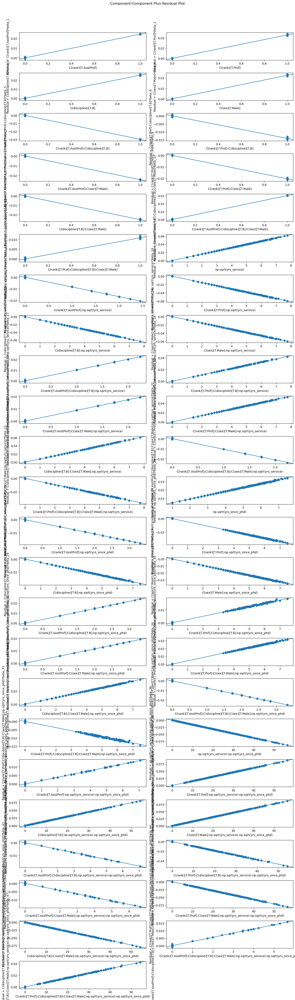

<F test: F=np.float64(4.2967644639708364), p=3.5510072335447996e-18, df_denom=299, df_num=65>
<F test: F=1.6006375829764217, p=0.20325391285017072, df_denom=347, df_num=2>


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 72, but rank is 65
  warnings.warn('covariance of constraints does not have full '


In [30]:
fig = sm.graphics.plot_ccpr_grid(salarysqrt, fig = plt.figure(figsize = (14,48)))
plt.show()

print(linear_reset(salarysqrt, power = [2,3], test_type = 'exog', use_f = True))
print(linear_reset(salarysqrt, power = [2,3], test_type = 'fitted', use_f = True))

In [31]:
salarysqrtbp = bptest(salarysqrt.resid, salarysqrt.model.exog)

labels = ["BP statistic", "BP p-value", "f-value", "f p-value"]

for stat, score in zip(labels, salarysqrtbp):
    print(f"{stat}:{score}")

BP statistic:67.46216381742214
BP p-value:0.026748584465536383
f-value:1.5201363712193163
f p-value:0.019639592137480955


In [32]:
X = salarysqrt.model.exog
vif = pd.DataFrame({"Variable": salarysqrt.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})
print(vif[vif["VIF"] >= 10])

                                             Variable           VIF
0                                           Intercept  4.429195e+06
1                                 C(rank)[T.AsstProf]  6.224689e+05
2                                     C(rank)[T.Prof]  9.808104e+05
3                                  C(discipline)[T.B]  1.391503e+06
4                                      C(sex)[T.Male]  3.926524e+05
5              C(rank)[T.AsstProf]:C(discipline)[T.B]  5.491737e+05
6                  C(rank)[T.Prof]:C(discipline)[T.B]  1.337261e+06
7                  C(rank)[T.AsstProf]:C(sex)[T.Male]  5.384150e+05
8                      C(rank)[T.Prof]:C(sex)[T.Male]  1.041146e+06
9                   C(discipline)[T.B]:C(sex)[T.Male]  1.403263e+06
10  C(rank)[T.AsstProf]:C(discipline)[T.B]:C(sex)[...  4.929432e+05
11  C(rank)[T.Prof]:C(discipline)[T.B]:C(sex)[T.Male]  1.287148e+06
12                               np.sqrt(yrs_service)  1.657100e+06
13           C(rank)[T.AsstProf]:np.sqrt(yrs_ser

In [33]:
rstudent = OLSInfluence(salarysqrt).resid_studentized_external
df = salarysqrt.df_resid
pval = 2 * (1 - t.cdf(np.abs(rstudent),df))
bonf_pval = np.minimum(pval * len(pval), 1.0)
outlier_table = pd.DataFrame({"rstudent": rstudent, "unadjusted p-value": pval, "Bonferri p-value": bonf_pval})
outlier_table = outlier_table.sort_values("Bonferri p-value").head(10)
outlier_table

C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:847: RuntimeWarning: invalid value encountered in sqrt
  return self.resid / sigma / np.sqrt(1 - hii)


,rstudent,unadjusted p-value,Bonferri p-value
317,4.674962,0.000004,0.001670
364,-3.771801,0.000190,0.075559
282,3.361295,0.000862,0.342094
0,-0.376749,0.706589,1.000000
269,-0.374850,0.707999,1.000000
268,0.654735,0.513070,1.000000
267,-0.062762,0.949992,1.000000
266,-1.984427,0.047991,1.000000
265,-0.658906,0.510391,1.000000
264,0.846530,0.397837,1.000000


In [73]:
print(salarysqrt.get_influence().summary_frame()[["hat_diag", "cooks_d", "standard_resid"]].sort_values("standard_resid", ascending = False).head(10))

C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:847: RuntimeWarning: invalid value encountered in sqrt
  return self.resid / sigma / np.sqrt(1 - hii)
C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:888: RuntimeWarning: invalid value encountered in sqrt
  dffits_ = self.resid_studentized_internal * np.sqrt(hii / (1 - hii))


     hat_diag   cooks_d  standard_resid
317  0.073581  0.034124        4.541245
282  0.083228  0.020756        3.312773
235  0.016151  0.002829        2.876184
69   0.032934  0.003600        2.252491
316  0.337967  0.053380        2.240339
298  0.047653  0.005129        2.218159
244  0.053652  0.005267        2.111752
73   0.017431  0.001637        2.104430
351  0.025429  0.002312        2.062309
334  0.983699  5.298800        2.052960


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:917: RuntimeWarning: invalid value encountered in sqrt
  dffits_ = self.resid_studentized_external * np.sqrt(hii / (1 - hii))


In [34]:
salarysqrt_mod = smf.ols("salary_inv_sqrt~C(rank)+C(discipline)+np.sqrt(yrs_service)+np.sqrt(yrs_since_phd)+C(discipline)*np.sqrt(yrs_service)+C(discipline)*np.sqrt(yrs_since_phd)+np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)+C(discipline)*np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)+C(rank)*C(discipline)*np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)+C(sex)*np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)", data = salaries).fit()
print(salarysqrt_mod.summary())
#"np.log(salary)~C(rank)+C(discipline)+np.sqrt(yrs_service)+np.sqrt(yrs_since_phd)+C(discipline)*np.sqrt(yrs_service)+C(discipline)*np.sqrt(yrs_since_phd)+np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)+C(discipline)*np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)+C(rank)*C(discipline)*np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)"

                            OLS Regression Results                            
Dep. Variable:        salary_inv_sqrt   R-squared:                       0.616
Model:                            OLS   Adj. R-squared:                  0.588
Method:                 Least Squares   F-statistic:                     21.93
Date:                Fri, 12 Dec 2025   Prob (F-statistic):           9.18e-61
Time:                        20:24:22   Log-Likelihood:                 2740.8
No. Observations:                 397   AIC:                            -5426.
Df Residuals:                     369   BIC:                            -5314.
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                                                                                         coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------

In [35]:
print(anova_lm(salarysqrt_mod, type = 3))

                                                       df        sum_sq  \
C(rank)                                               2.0  2.901812e-05   
C(discipline)                                         1.0  4.066792e-06   
C(sex)                                                1.0  1.450014e-07   
C(rank):C(discipline)                                 2.0  3.681650e-07   
np.sqrt(yrs_service)                                  1.0  2.101626e-07   
C(discipline):np.sqrt(yrs_service)                    1.0  3.946382e-07   
C(rank):np.sqrt(yrs_service)                          2.0  1.410968e-07   
C(sex):np.sqrt(yrs_service)                           1.0  2.338326e-08   
C(rank):C(discipline):np.sqrt(yrs_service)            2.0  7.254701e-09   
np.sqrt(yrs_since_phd)                                1.0  1.704668e-07   
C(discipline):np.sqrt(yrs_since_phd)                  1.0  5.118209e-07   
C(rank):np.sqrt(yrs_since_phd)                        2.0  4.584684e-08   
C(sex):np.sqrt(yrs_since_

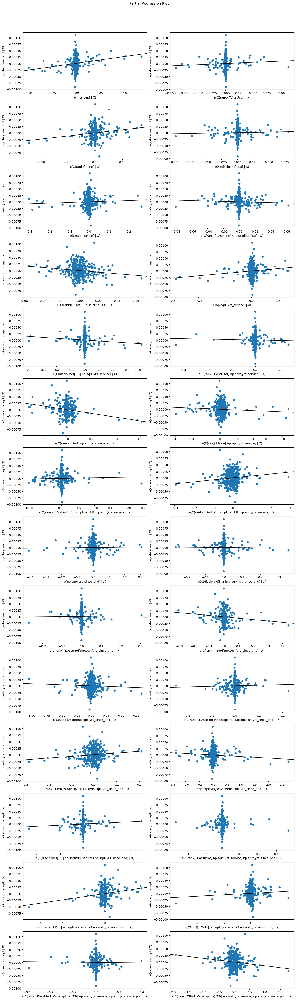

In [36]:
fig = sm.graphics.plot_partregress_grid(salarysqrt_mod, fig = plt.figure(figsize = (14, 48)))
plt.show()

In [37]:
print(anova_lm(salarysqrt_mod, salarysqrt))

   df_resid       ssr  df_diff   ss_diff         F    Pr(>F)
0     369.0  0.000023      0.0       NaN       NaN       NaN
1     349.0  0.000022     20.0  0.000001  0.916355  0.566443


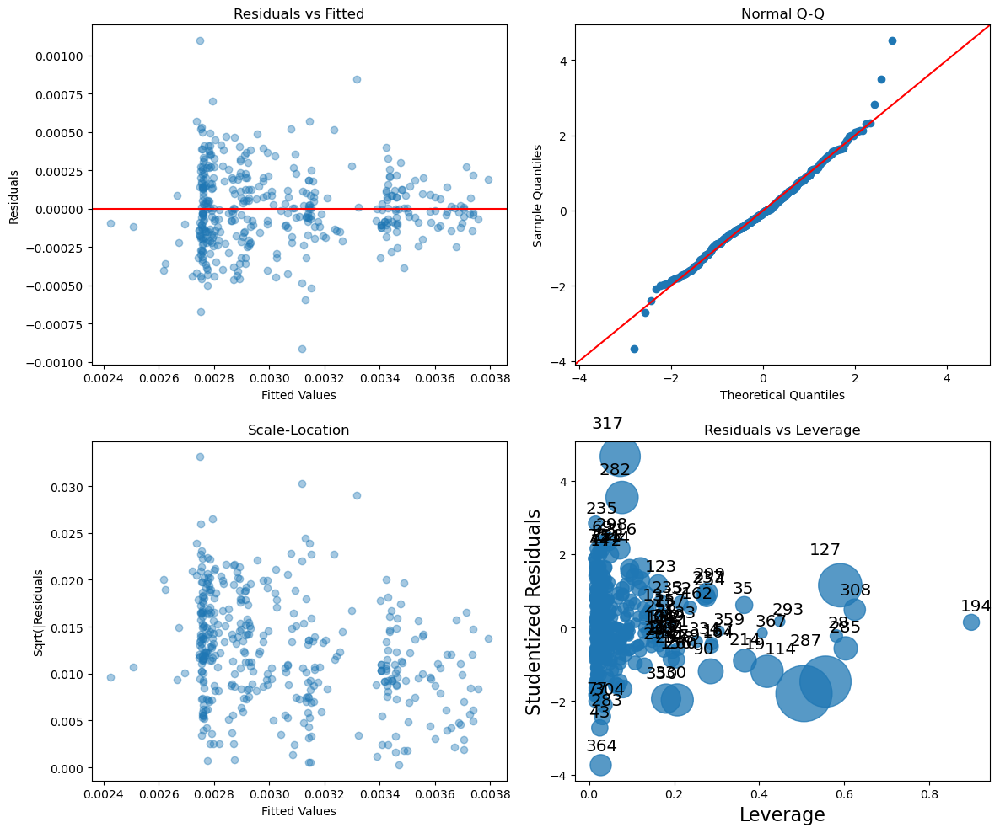

In [38]:
fig, axes = plt.subplots(2,2, figsize = (12, 10))

axes[0,0].scatter(salarysqrt_mod.fittedvalues, salarysqrt_mod.resid, alpha = 0.4)
axes[0,0].axhline(0, color = 'red')
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Residuals")
axes[0,0].set_title("Residuals vs Fitted")
sm.qqplot(salarysqrt_mod.get_influence().resid_studentized_internal, line = '45', ax = axes[0,1])
axes[0,1].set_title("Normal Q-Q")
axes[1,0].scatter(salarysqrt_mod.fittedvalues, np.sqrt(np.abs(salarysqrt_mod.resid)), alpha = 0.4)
axes[1,0].set_xlabel("Fitted Values")
axes[1,0].set_ylabel("Sqrt(|Residuals")
axes[1,0].set_title("Scale-Location")
sm.graphics.influence_plot(salarysqrt_mod, ax = axes[1,1], criterion = 'cooks')
axes[1,1].set_title("Residuals vs Leverage")
plt.tight_layout()
plt.show()

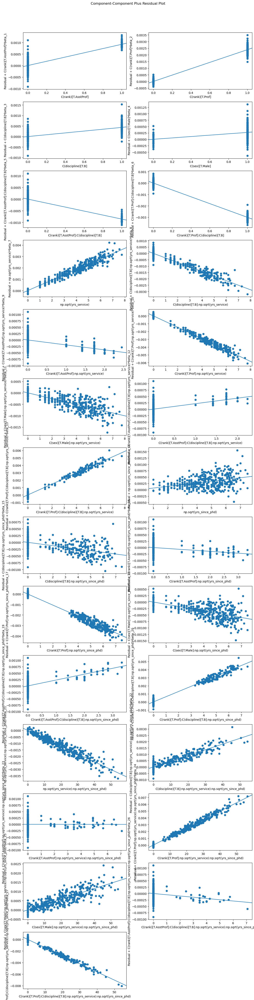

<F test: F=np.float64(0.9505244280267883), p=0.5611423925049117, df_denom=327, df_num=41>
<F test: F=1.2968032656038746, p=0.2746541922528517, df_denom=367, df_num=2>


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 42, but rank is 41
  warnings.warn('covariance of constraints does not have full '


In [39]:
fig = sm.graphics.plot_ccpr_grid(salarysqrt_mod, fig = plt.figure(figsize = (12,48)))
plt.show()

print(linear_reset(salarysqrt_mod, power = [2,3], test_type = 'exog', use_f = True))
print(linear_reset(salarysqrt_mod, power = [2,3], test_type = 'fitted', use_f = True))

In [40]:
salarysqrtmodbp = bptest(salarysqrt_mod.resid, salarysqrt_mod.model.exog)

labels = ["BP statistics", "BP p-value", "f-value", "p f-value"]

for stat, score in zip(labels, salarysqrtmodbp):
    print(f"{stat}:{score}")

BP statistics:61.516700995715325
BP p-value:0.00016632012692552873
f-value:2.506021162414721
p f-value:7.262407342311691e-05


In [41]:
X = salarysqrt_mod.model.exog
vif = pd.DataFrame({"Variable": salarysqrt_mod.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})
print(vif[vif["VIF"] >= 10])

                                             Variable          VIF
0                                           Intercept  3344.540841
1                                 C(rank)[T.AsstProf]   716.174110
2                                     C(rank)[T.Prof]   836.881898
3                                  C(discipline)[T.B]  1172.951148
4                                      C(sex)[T.Male]    44.169155
5              C(rank)[T.AsstProf]:C(discipline)[T.B]   713.677160
6                  C(rank)[T.Prof]:C(discipline)[T.B]  1567.543822
7                                np.sqrt(yrs_service)   643.624358
8             C(discipline)[T.B]:np.sqrt(yrs_service)  1485.075790
9            C(rank)[T.AsstProf]:np.sqrt(yrs_service)   375.972638
10               C(rank)[T.Prof]:np.sqrt(yrs_service)  1203.818316
11                C(sex)[T.Male]:np.sqrt(yrs_service)   279.890954
12  C(rank)[T.AsstProf]:C(discipline)[T.B]:np.sqrt...   346.260495
13  C(rank)[T.Prof]:C(discipline)[T.B]:np.sqrt(yrs...  2134.15

In [42]:
rstudent = OLSInfluence(salarysqrt_mod).resid_studentized_external
df = salarysqrt_mod.df_resid
pval = 2 * (1 - t.cdf(np.abs(rstudent), df))
bonf_pval = np.minimum(pval * len(pval), 1.0)
outlier_table = pd.DataFrame({"rstudent": rstudent, "unadjusted p-value": pval, "Bonferri p-value": bonf_pval})
outlier_table = outlier_table.sort_values("Bonferri p-value").head(10)
outlier_table

,rstudent,unadjusted p-value,Bonferri p-value
317,4.657833,0.000004,0.001773
364,-3.741936,0.000212,0.084039
282,3.540655,0.000450,0.178735
268,0.739743,0.459926,1.000000
267,0.024029,0.980842,1.000000
266,-1.955374,0.051293,1.000000
265,-0.721949,0.470783,1.000000
264,0.798849,0.424892,1.000000
263,-0.462149,0.644247,1.000000
262,-0.002924,0.997669,1.000000


In [72]:
print(salarysqrt_mod.get_influence().summary_frame()[["hat_diag", "cooks_d", "standard_resid"]].sort_values("cooks_d", ascending = False).head(10))

     hat_diag   cooks_d  standard_resid
114  0.505130  0.116660       -1.788890
287  0.555668  0.096185       -1.467499
127  0.590226  0.068184        1.151284
317  0.073186  0.057936        4.532465
282  0.077488  0.036467        3.486573
19   0.418420  0.036378       -1.189870
330  0.207308  0.035897       -1.960441
350  0.181097  0.029296       -1.925949
90   0.285960  0.020257       -1.190081
285  0.603144  0.017421       -0.566526


In [43]:
salarylog = smf.ols("np.log(salary)~C(rank)*C(discipline)*C(sex)*np.log(yrs_service_plus)*np.log(yrs_since_phd)", data = salaries).fit()
print(salarylog.summary())

                            OLS Regression Results                            
Dep. Variable:         np.log(salary)   R-squared:                       0.600
Model:                            OLS   Adj. R-squared:                  0.546
Method:                 Least Squares   F-statistic:                     11.15
Date:                Fri, 12 Dec 2025   Prob (F-statistic):           7.83e-46
Time:                        20:24:35   Log-Likelihood:                 153.74
No. Observations:                 397   AIC:                            -211.5
Df Residuals:                     349   BIC:                            -20.25
Df Model:                          47                                         
Covariance Type:            nonrobust                                         
                                                                                                           coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [44]:
print(anova_lm(salarylog, type = 3))

                                                       df     sum_sq  \
C(rank)                                               2.0  12.174021   
C(discipline)                                         1.0   1.654867   
C(sex)                                                1.0   0.057625   
C(rank):C(discipline)                                 2.0   0.096166   
C(rank):C(sex)                                        2.0   0.020933   
C(discipline):C(sex)                                  1.0   0.044435   
C(rank):C(discipline):C(sex)                          2.0   0.015876   
np.log(yrs_service_plus)                              1.0   0.020592   
C(rank):np.log(yrs_service_plus)                      2.0   0.107856   
C(discipline):np.log(yrs_service_plus)                1.0   0.090523   
C(sex):np.log(yrs_service_plus)                       1.0   0.052494   
C(rank):C(discipline):np.log(yrs_service_plus)        2.0   0.019137   
C(rank):C(sex):np.log(yrs_service_plus)               2.0   0.03

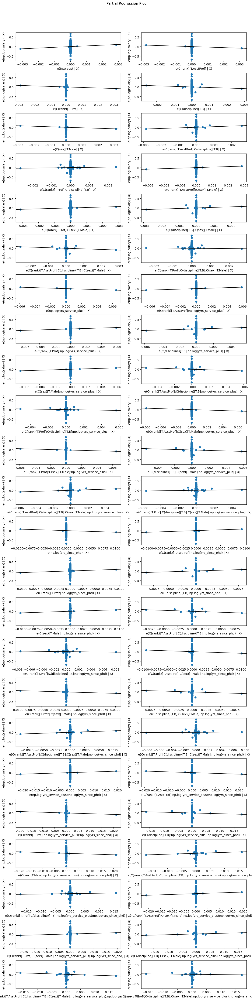

In [45]:
fig = sm.graphics.plot_partregress_grid(salarylog, fig = plt.figure(figsize = (12, 48)))
plt.show()

C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:847: RuntimeWarning: invalid value encountered in sqrt
  return self.resid / sigma / np.sqrt(1 - hii)


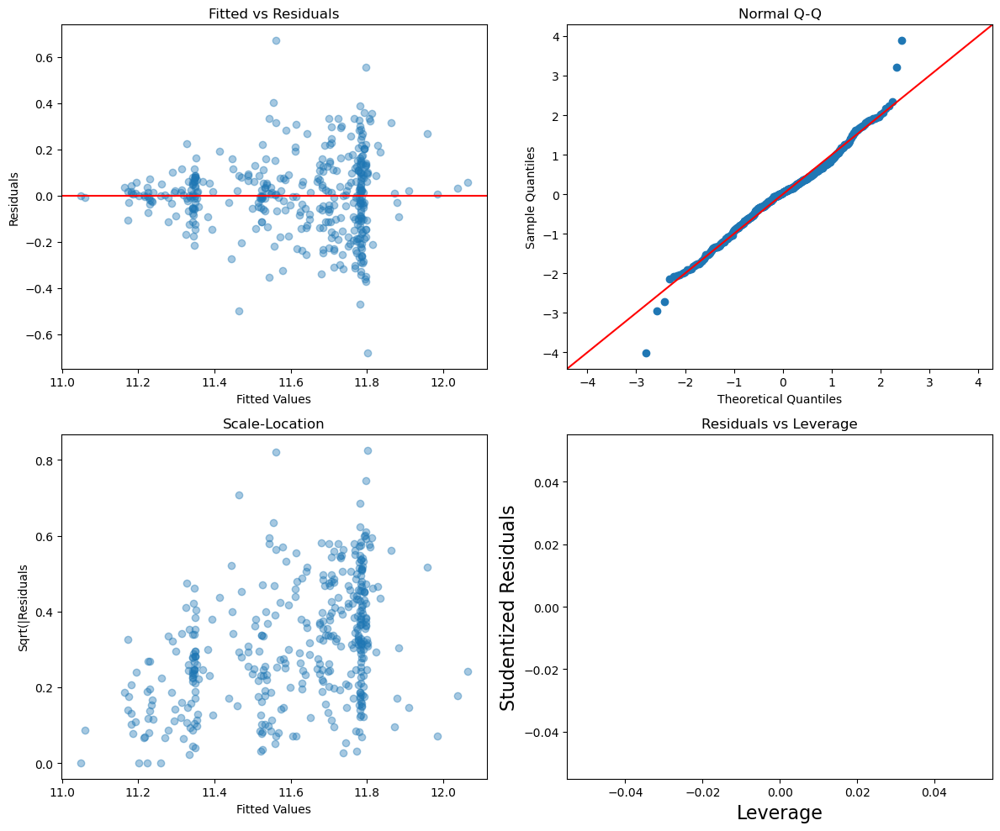

In [46]:
fig, axes = plt.subplots(2,2, figsize = (12, 10))

axes[0,0].scatter(salarylog.fittedvalues, salarylog.resid, alpha = 0.4)
axes[0,0].axhline(0, color = 'red')
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Residuals")
axes[0,0].set_title("Fitted vs Residuals")
sm.qqplot(salarylog.get_influence().resid_studentized_internal, line = '45', ax = axes[0, 1])
axes[0,1].set_title("Normal Q-Q")
axes[1,0].scatter(salarylog.fittedvalues, np.sqrt(np.abs(salarylog.resid)), alpha = 0.4)
axes[1,0].set_xlabel("Fitted Values")
axes[1,0].set_ylabel("Sqrt(|Residuals")
axes[1,0].set_title("Scale-Location")
sm.graphics.influence_plot(salarylog, ax = axes[1,1], criterion = 'cooks')
axes[1,1].set_title("Residuals vs Leverage")
plt.tight_layout()
plt.show()

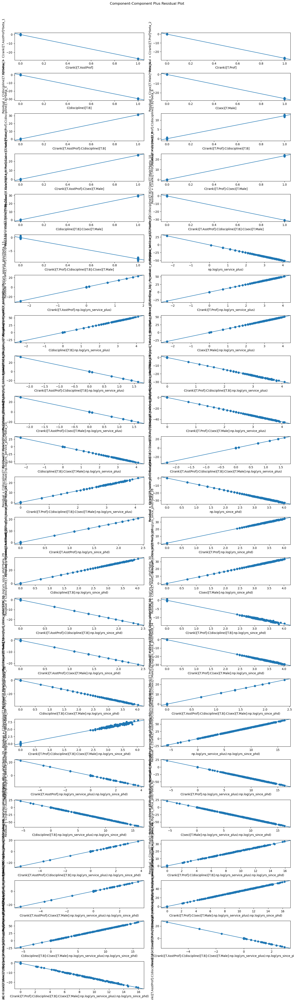

<F test: F=np.float64(49.66232374691572), p=1.681383795684224e-128, df_denom=299, df_num=68>
<F test: F=1.3737465265595574, p=0.2545300164181918, df_denom=347, df_num=2>


C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\base\model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 72, but rank is 68
  warnings.warn('covariance of constraints does not have full '


In [47]:
fig = sm.graphics.plot_ccpr_grid(salarylog, fig = plt.figure(figsize = (14, 48)))
plt.show()

print(linear_reset(salarylog, power = [2, 3], test_type = 'exog', use_f = True))
print(linear_reset(salarylog, power = [2, 3], test_type = 'fitted', use_f = True))

In [48]:
salarylogbp = bptest(salarylog.resid, salarylog.model.exog)

labels = ["BP statistic", "BP p-value", "f-value", "f p-value"]

for stat, score in zip(labels, salarylogbp):
    print(f"{stat}:{score}")

BP statistic:73.32236654873141
BP p-value:0.008325995414668485
f-value:1.6820982255639982
f p-value:0.004974788220996804


In [49]:
X = salarylog.model.exog
vif = pd.DataFrame({"Variable": salarylog.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})
print(vif[vif["VIF"] >= 10])

                                             Variable           VIF
0                                           Intercept  2.195500e+07
1                                 C(rank)[T.AsstProf]  3.080550e+06
2                                     C(rank)[T.Prof]  4.860791e+06
3                                  C(discipline)[T.B]  5.988231e+06
4                                      C(sex)[T.Male]  1.945890e+06
5              C(rank)[T.AsstProf]:C(discipline)[T.B]  2.334383e+06
6                  C(rank)[T.Prof]:C(discipline)[T.B]  5.801075e+06
7                  C(rank)[T.AsstProf]:C(sex)[T.Male]  2.662020e+06
8                      C(rank)[T.Prof]:C(sex)[T.Male]  5.158585e+06
9                   C(discipline)[T.B]:C(sex)[T.Male]  6.037550e+06
10  C(rank)[T.AsstProf]:C(discipline)[T.B]:C(sex)[...  2.093621e+06
11  C(rank)[T.Prof]:C(discipline)[T.B]:C(sex)[T.Male]  5.582797e+06
12                           np.log(yrs_service_plus)  7.650986e+06
13       C(rank)[T.AsstProf]:np.log(yrs_service_

In [50]:
rstudent = OLSInfluence(salarylog).resid_studentized_external
df = salarylog.df_resid
pval = 2 * (1 - t.cdf(np.abs(rstudent), df))
bonf_pval = np.minimum(pval * len(pval), 1.0)
outlier_table = pd.DataFrame({"rstudent": rstudent, "unadjusted p-value": pval, "Bonferri p-value": bonf_pval})
outlier_table = outlier_table.sort_values("Bonferri p-value").head(10)
outlier_table

C:\Users\tariq\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:847: RuntimeWarning: invalid value encountered in sqrt
  return self.resid / sigma / np.sqrt(1 - hii)


,rstudent,unadjusted p-value,Bonferri p-value
317,-4.105191,0.000050,0.019989
364,3.974598,0.000086,0.034021
43,3.254644,0.001246,0.494829
0,0.369486,0.711990,1.000000
269,0.515638,0.606434,1.000000
268,-0.789878,0.430136,1.000000
267,0.041282,0.967094,1.000000
266,1.838888,0.066781,1.000000
265,0.723974,0.469567,1.000000
264,-0.792004,0.428897,1.000000


In [51]:
salarylog_mod = smf.ols("np.log(salary)~C(rank)+C(discipline)+np.log(yrs_service_plus)+np.log(yrs_since_phd)+C(discipline)*np.log(yrs_service_plus)+C(discipline)*np.log(yrs_since_phd)+np.log(yrs_service_plus)*np.log(yrs_since_phd)+C(discipline)*np.log(yrs_service_plus)*np.log(yrs_since_phd)+C(rank)*C(discipline)*np.log(yrs_service_plus)*np.log(yrs_since_phd)", data = salaries).fit()
print(salarylog_mod.summary())
##C(rank)+C(discipline)+C(discipline)*np.sqrt(yrs_since_phd)+C(rank)*C(discipline)*np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)

                            OLS Regression Results                            
Dep. Variable:         np.log(salary)   R-squared:                       0.573
Model:                            OLS   Adj. R-squared:                  0.547
Method:                 Least Squares   F-statistic:                     21.80
Date:                Fri, 12 Dec 2025   Prob (F-statistic):           2.41e-55
Time:                        20:24:53   Log-Likelihood:                 140.81
No. Observations:                 397   AIC:                            -233.6
Df Residuals:                     373   BIC:                            -138.0
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                                                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

In [52]:
print(anova_lm(salarylog_mod, type = 3))

                                                       df     sum_sq  \
C(rank)                                               2.0  12.174021   
C(discipline)                                         1.0   1.654867   
C(rank):C(discipline)                                 2.0   0.097004   
np.log(yrs_service_plus)                              1.0   0.014629   
C(discipline):np.log(yrs_service_plus)                1.0   0.096249   
C(rank):np.log(yrs_service_plus)                      2.0   0.112830   
C(rank):C(discipline):np.log(yrs_service_plus)        2.0   0.008234   
np.log(yrs_since_phd)                                 1.0   0.039020   
C(discipline):np.log(yrs_since_phd)                   1.0   0.103351   
C(rank):np.log(yrs_since_phd)                         2.0   0.008707   
C(rank):C(discipline):np.log(yrs_since_phd)           2.0   0.002342   
np.log(yrs_service_plus):np.log(yrs_since_phd)        1.0   0.166036   
C(discipline):np.log(yrs_service_plus):np.log(y...    1.0   0.36

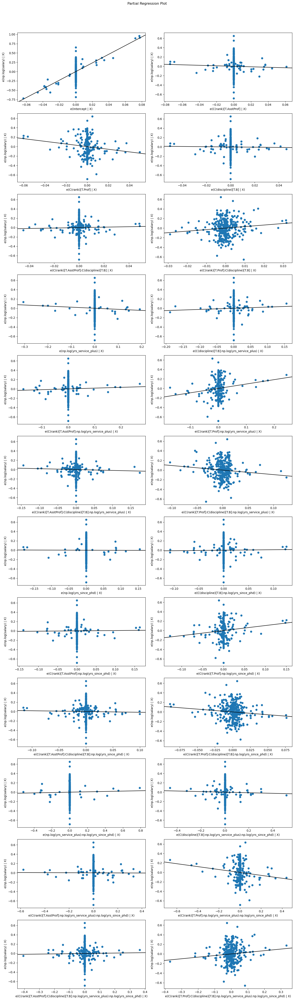

In [53]:
fig = sm.graphics.plot_partregress_grid(salarylog_mod, fig = plt.figure(figsize = (14,48)))
plt.show()

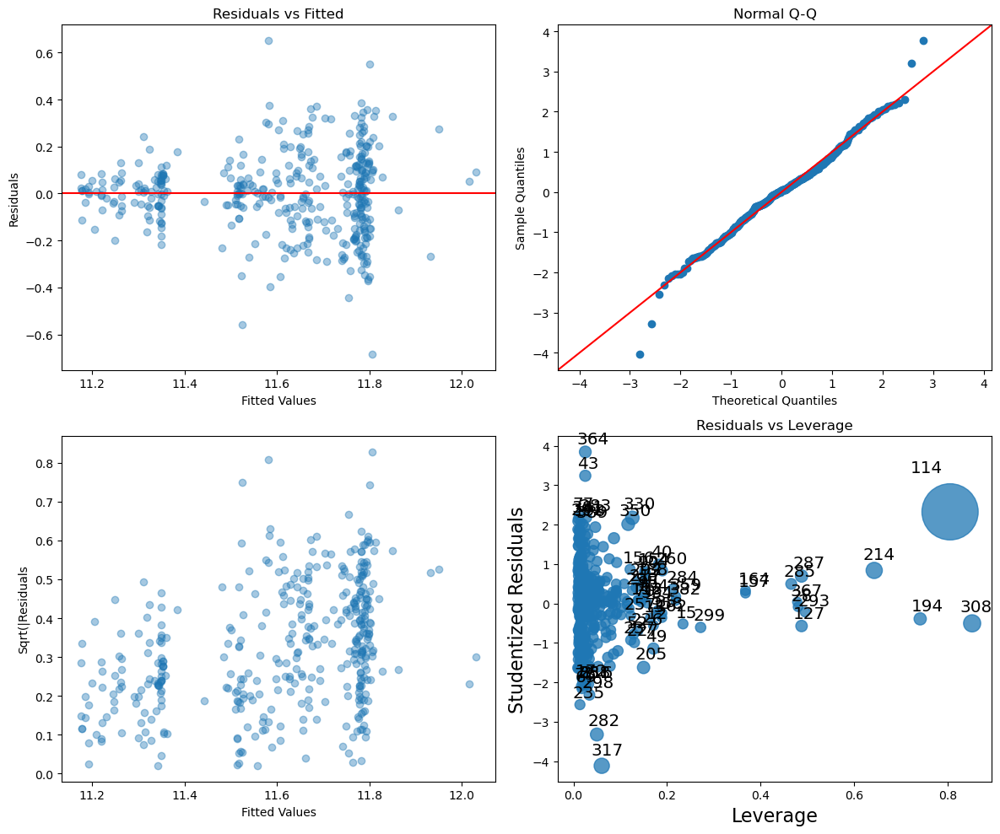

In [54]:
fig, axes = plt.subplots(2,2, figsize = (12, 10))

axes[0,0].scatter(salarylog_mod.fittedvalues, salarylog_mod.resid, alpha = 0.4)
axes[0,0].axhline(0, color = 'red')
axes[0,0].set_xlabel("Fitted Values")
axes[0,0].set_ylabel("Residuals")
axes[0,0].set_title("Residuals vs Fitted")
sm.qqplot(salarylog_mod.get_influence().resid_studentized_internal, line = '45', ax = axes[0,1])
axes[0,1].set_title("Normal Q-Q")
axes[1,0].scatter(salarylog_mod.fittedvalues, np.sqrt(np.abs(salarylog_mod.resid)), alpha = 0.4)
axes[1,0].set_xlabel("Fitted Values")
axes[1,0].set_ylabel("Sqrt(|Residuals")
sm.graphics.influence_plot(salarylog_mod, ax = axes[1,1], criterion = 'cooks')
axes[1,1].set_title("Residuals vs Leverage")
plt.tight_layout()
plt.show()

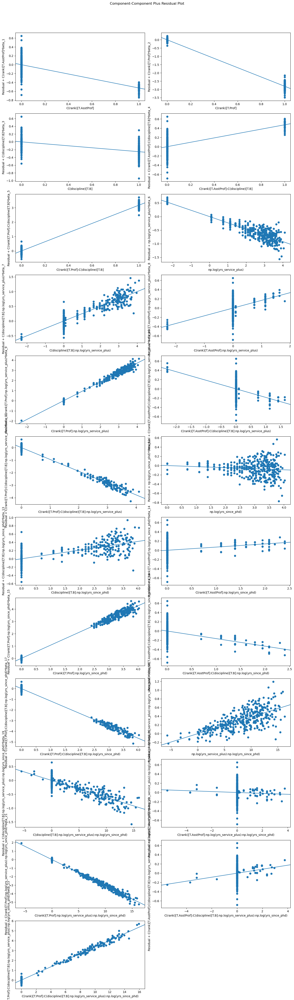

<F test: F=0.9554845710948909, p=0.5458779275978995, df_denom=337, df_num=36>
<F test: F=0.6223066607399019, p=0.5372642891895115, df_denom=371, df_num=2>


In [55]:
fig = sm.graphics.plot_ccpr_grid(salarylog_mod, fig = plt.figure(figsize = (14, 48)))
plt.show()

print(linear_reset(salarylog_mod, power = [2,3], test_type = 'exog', use_f = True))
print(linear_reset(salarylog_mod, power = [2,3], test_type = 'fitted', use_f =True))

In [56]:
salarylog_modbp = bptest(salarylog_mod.resid, salarylog_mod.model.exog)

labels = ["BP statistic", "BP p-value", "f-value", "f p-value"]

for stat, score in zip(labels, salarylog_modbp):
    print(f"{stat}:{score}")

BP statistic:68.13619886905187
BP p-value:2.350987039417268e-06
f-value:3.3600274498143574
f p-value:5.600129844417933e-07


In [57]:
X = salarylog_mod.model.exog
vif = pd.DataFrame({"Variable": salarylog_mod.model.exog_names,
                    "VIF": [variance_inflation_factor(X, i) for i in range(X.shape[1])]})
print(vif[vif["VIF"] >= 10])

                                             Variable           VIF
0                                           Intercept  10225.643511
1                                 C(rank)[T.AsstProf]   1493.524007
2                                     C(rank)[T.Prof]   2903.204108
3                                  C(discipline)[T.B]   3906.986571
4              C(rank)[T.AsstProf]:C(discipline)[T.B]   1568.089632
5                  C(rank)[T.Prof]:C(discipline)[T.B]   5619.010428
6                            np.log(yrs_service_plus)   1377.259629
7         C(discipline)[T.B]:np.log(yrs_service_plus)   3830.367252
8        C(rank)[T.AsstProf]:np.log(yrs_service_plus)    300.432317
9            C(rank)[T.Prof]:np.log(yrs_service_plus)   2584.860429
10  C(rank)[T.AsstProf]:C(discipline)[T.B]:np.log(...    377.623113
11  C(rank)[T.Prof]:C(discipline)[T.B]:np.log(yrs_...   5446.632352
12                              np.log(yrs_since_phd)   1166.172509
13           C(discipline)[T.B]:np.log(yrs_since

In [58]:
rstudent = OLSInfluence(salarylog_mod).resid_studentized_external
df = salarylog_mod.df_resid
pval = 2 * (1 - t.cdf(np.abs(rstudent), df))
bonf_pval = np.minimum(pval * len(pval), 1.0)
outlier_table = pd.DataFrame({"rstudent": rstudent, "unadjusted p-value": pval, "Bonferri p-value": bonf_pval})
outlier_table = outlier_table.sort_values("Bonferri p-value").head(10)
outlier_table

,rstudent,unadjusted p-value,Bonferri p-value
317,-4.119773,0.000047,0.018560
364,3.841030,0.000144,0.057144
282,-3.325765,0.000969,0.384809
43,3.237350,0.001314,0.521848
0,0.385111,0.700374,1.000000
268,-1.001519,0.317225,1.000000
267,-0.071911,0.942711,1.000000
266,1.716776,0.086850,1.000000
265,0.799366,0.424587,1.000000
264,-0.748971,0.454347,1.000000


In [59]:
print(anova_lm(salarylog_mod, salarylog))

   df_resid        ssr  df_diff   ss_diff         F    Pr(>F)
0     373.0  11.434990      0.0       NaN       NaN       NaN
1     349.0  10.714123     24.0  0.720867  0.978391  0.494357


In [60]:
formula_log  = """
     C(rank)+C(discipline)+np.log(yrs_service_plus)+np.log(yrs_since_phd)+C(discipline)*np.log(yrs_service_plus)
    +C(discipline)*np.log(yrs_since_phd)+np.log(yrs_service_plus)*np.log(yrs_since_phd)+C(discipline)*np.log(yrs_service_plus)*np.log(yrs_since_phd)
    +C(rank)*C(discipline)*np.log(yrs_service_plus)*np.log(yrs_since_phd)
"""

formula_sqrt = """
     C(rank)+C(discipline)+np.sqrt(yrs_service)+np.sqrt(yrs_since_phd)+C(discipline)*np.sqrt(yrs_service)
    +C(discipline)*np.sqrt(yrs_since_phd)+np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)+C(discipline)*np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)
    +C(rank)*C(discipline)*np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)+C(sex)*np.sqrt(yrs_service)*np.sqrt(yrs_since_phd)
"""

formula_power = """
      C(rank)+C(discipline)+I(yrs_service_plus**0.52)+I(yrs_since_phd**0.59)+C(discipline)*I(yrs_service_plus**0.52)
     +C(discipline)*I(yrs_since_phd**0.59)+I(yrs_service_plus**0.52)*I(yrs_since_phd**0.59)+C(discipline)*I(yrs_service_plus**0.52)*I(yrs_since_phd**0.59)
     +C(rank)*C(discipline)*I(yrs_service_plus**0.52)*I(yrs_since_phd**0.59)
"""

Y_log = np.log(salaries["salary"])
Y_sqrt = 1/np.sqrt(salaries["salary"])
Y_pwr = salaries["salary"]**-0.25
X_log = dmatrix(formula_log + "- 1", data = salaries, return_type = 'dataframe')
X_sqrt = dmatrix(formula_sqrt + "- 1", data = salaries, return_type = 'dataframe')
X_pwr = dmatrix(formula_power + "- 1", data = salaries, return_type = 'dataframe')

X_log = pd.get_dummies(X_log, drop_first = True)
X_sqrt = pd.get_dummies(X_sqrt, drop_first = True)
X_pwr = pd.get_dummies(X_pwr, drop_first = True)


In [61]:
Xlog_train, Xlog_test, Ylog_train, Ylog_test = train_test_split(X_log, Y_log, test_size = 0.2, random_state = 0)
Xsqrt_train, Xsqrt_test, Ysqrt_train, Ysqrt_test = train_test_split(X_sqrt, Y_sqrt, test_size = 0.2, random_state = 0)
Xpwr_train, Xpwr_test, Ypwr_train, Ypwr_test = train_test_split(X_pwr, Y_pwr, test_size = 0.2, random_state = 0)

enet_pipe = make_pipeline(
    StandardScaler(with_mean = True, with_std = True),
    ElasticNetCV(l1_ratio = np.arange(0.01, 1.01, 0.01), cv = 10, random_state = 0, max_iter = 50000)
)

nested_score_log = cross_val_score(enet_pipe, X_log, Y_log, cv = 10, scoring = 'r2')
nested_score_sqrt = cross_val_score(enet_pipe, X_sqrt, Y_sqrt, cv = 10, scoring = 'r2')
nested_score_pwr = cross_val_score(enet_pipe, X_pwr, Y_pwr, cv = 10, scoring = 'r2')
mean_squared_error_log = cross_val_score(enet_pipe, X_log, Y_log, cv = 10, scoring = 'neg_mean_squared_error')
mean_squared_error_sqrt = cross_val_score(enet_pipe, X_sqrt, Y_sqrt, cv = 10, scoring = 'neg_mean_squared_error')
mean_squared_error_pwr = cross_val_score(enet_pipe, X_pwr, Y_pwr, cv = 10, scoring = 'neg_mean_squared_error')

print("Nested CV R2 Score Log:", nested_score_log.mean())
print("Nested CV R2 Score Sqrt:", nested_score_sqrt.mean())
print("Nested CV R2 Score Pwr:", nested_score_pwr.mean())
print("MSE Log:", -mean_squared_error_log.mean())
print("MSE Sqrt:", -mean_squared_error_sqrt.mean())
print("MSE Pwr:", -mean_squared_error_pwr.mean())

enet_pipe.fit(Xlog_train, Ylog_train)
enet_cv = enet_pipe.named_steps["elasticnetcv"]

coef = pd.Series(enet_cv.coef_, index = X_log.columns)
tol = 1e-6
enet_results = pd.DataFrame({"Coefficient": coef,
                             "Selected": coef.abs() > tol})
print("Best alpha:", enet_cv.alpha_)
print("Best l1 ratio:", enet_cv.l1_ratio_)
print("Hold-Out Score:", enet_pipe.score(Xlog_test, Ylog_test))
print("Chosen:", enet_results[enet_results["Selected"] == True])
print("Neglected:", enet_results[enet_results["Selected"] == False])

Nested CV R2 Score Log: 0.47294230970912193
Nested CV R2 Score Sqrt: 0.5105877316005414
Nested CV R2 Score Pwr: 0.5029852039151838
MSE Log: 0.03483830934025378
MSE Sqrt: 7.263823428462424e-08
MSE Pwr: 6.097472729229298e-06
Best alpha: 0.00017370630697514182
Best l1 ratio: 1.0
Hold-Out Score: 0.5522413666166897
Chosen:                                                     Coefficient  Selected
C(rank)[AsstProf]                                      0.002234      True
C(rank)[Prof]                                         -0.408979      True
C(discipline)[T.B]                                     0.231504      True
C(discipline)[T.B]:np.log(yrs_service_plus)            0.058735      True
C(rank)[T.AsstProf]:np.log(yrs_service_plus)          -0.021258      True
C(rank)[T.Prof]:np.log(yrs_service_plus)               0.616196      True
C(rank)[T.AsstProf]:C(discipline)[T.B]:np.log(y...     0.006614      True
np.log(yrs_since_phd)                                  0.234265      True
C(discipline)[

In [62]:
enet_pipe.fit(Xsqrt_train, Ysqrt_train)
enet_cv = enet_pipe.named_steps["elasticnetcv"]

coef = pd.Series(enet_cv.coef_, index = X_sqrt.columns)
tol = 1e-6
enet_results = pd.DataFrame({"Coefficient": coef,
                             "Selected": coef.abs() > tol})
print("Best alpha:", enet_cv.alpha_)
print("Best l1 ratio:", enet_cv.l1_ratio_)
print("Hold-Out Score:", enet_pipe.score(Xsqrt_test, Ysqrt_test))
print("Chosen:", enet_results[enet_results["Selected"] == True])
print("Neglected:", enet_results[enet_results["Selected"] == False])

Best alpha: 2.663770679986035e-07
Best l1 ratio: 1.0
Hold-Out Score: 0.6209501266537782
Chosen:                                                     Coefficient  Selected
C(rank)[AssocProf]                                    -0.000037      True
C(rank)[Prof]                                          0.000248      True
C(discipline)[T.B]                                    -0.000512      True
C(sex)[T.Male]                                         0.000032      True
C(rank)[T.AsstProf]:C(discipline)[T.B]                 0.000149      True
C(rank)[T.Prof]:C(discipline)[T.B]                    -0.000090      True
np.sqrt(yrs_service)                                   0.000270      True
C(rank)[T.Prof]:np.sqrt(yrs_service)                  -0.000881      True
C(sex)[T.Male]:np.sqrt(yrs_service)                   -0.000094      True
C(rank)[T.AsstProf]:C(discipline)[T.B]:np.sqrt(...    -0.000084      True
C(rank)[T.Prof]:C(discipline)[T.B]:np.sqrt(yrs_...     0.000225      True
np.sqrt(yrs_sinc

In [63]:
enet_pipe.fit(Xpwr_train, Ypwr_train)
enet_cv = enet_pipe.named_steps["elasticnetcv"]

coef = pd.Series(enet_cv.coef_, index = X_pwr.columns)
tol = 1e-6
enet_results = pd.DataFrame({"Coefficient": coef,
                             "Selected": coef.abs() > tol})
print("Best alpha:", enet_cv.alpha_)
print("Best l1 ratio:", enet_cv.l1_ratio_)
print("Hold-Out Score:", enet_pipe.score(Xpwr_test, Ypwr_test))
print("Chosen:", enet_results[enet_results["Selected"] == True])
print("Neglected:", enet_results[enet_results["Selected"] == False])

Best alpha: 2.4017065265377613e-06
Best l1 ratio: 1.0
Hold-Out Score: 0.5863941355701412
Chosen:                                                     Coefficient  Selected
C(rank)[AssocProf]                                    -0.000538      True
C(rank)[Prof]                                          0.002738      True
C(discipline)[T.B]                                    -0.003784      True
C(rank)[T.AsstProf]:C(discipline)[T.B]                 0.001394      True
C(rank)[T.Prof]:C(discipline)[T.B]                    -0.002403      True
I(yrs_service_plus ** 0.52)                            0.002071      True
C(rank)[T.Prof]:I(yrs_service_plus ** 0.52)           -0.008327      True
C(rank)[T.AsstProf]:C(discipline)[T.B]:I(yrs_se...    -0.000826      True
C(rank)[T.Prof]:C(discipline)[T.B]:I(yrs_servic...     0.003152      True
I(yrs_since_phd ** 0.59)                              -0.002953      True
C(discipline)[T.B]:I(yrs_since_phd ** 0.59)            0.005601      True
C(rank)[T.AsstP

In [64]:
outer = KFold(n_splits = 10, shuffle = True, random_state = 0)

enet_pipe_2 = make_pipeline(
    StandardScaler(with_mean = True, with_std = True),
    ElasticNetCV(l1_ratio = np.arange(0.01, 1.01, 0.01), cv = 10, random_state = 0, max_iter = 50000)
)

nested_score_log = cross_val_score(enet_pipe_2, X_log, Y_log, cv = outer, scoring = 'r2')
nested_score_sqrt = cross_val_score(enet_pipe_2, X_sqrt, Y_sqrt, cv = outer, scoring = 'r2')
nested_score_pwr = cross_val_score(enet_pipe_2, X_pwr, Y_pwr, cv = outer, scoring = 'r2')
mean_squared_error_log = cross_val_score(enet_pipe_2, X_log, Y_log, cv = outer, scoring = 'neg_mean_squared_error')
mean_squared_error_sqrt = cross_val_score(enet_pipe_2, X_sqrt, Y_sqrt, cv = outer, scoring = 'neg_mean_squared_error')
mean_squared_error_pwr = cross_val_score(enet_pipe_2, X_pwr, Y_pwr, cv = outer, scoring = 'neg_mean_squared_error')

print("Nested CV R2 Score log:", nested_score_log.mean())
print("Nested CV R2 Score sqrt:", nested_score_sqrt.mean())
print("Nested CV R2 Score pwr:", nested_score_pwr.mean())

enet_pipe_2.fit(X_log, Y_log)
enet_cv_2 = enet_pipe_2.named_steps["elasticnetcv"]

coef = pd.Series(enet_cv_2.coef_, index = X_log.columns)
tol = 1e-6 
enet_results_2 = pd.DataFrame({"Coefficient": coef,
                               "Selected": coef.abs() > tol})
print("Best alpha:", enet_cv_2.alpha_)
print("Best l1 ratio:", enet_cv_2.l1_ratio_)
print("Chosen:", enet_results_2[enet_results_2["Selected"] == True])
print("Neglected:", enet_results_2[enet_results_2["Selected"] == False])

Nested CV R2 Score log: 0.4985068849230975
Nested CV R2 Score sqrt: 0.5454602137748524
Nested CV R2 Score pwr: 0.5306937089846631
Best alpha: 0.00021005032814626364
Best l1 ratio: 0.81
Chosen:                                                     Coefficient  Selected
C(rank)[AsstProf]                                      0.028573      True
C(rank)[Prof]                                         -0.286292      True
C(discipline)[T.B]                                     0.144626      True
C(rank)[T.AsstProf]:C(discipline)[T.B]                -0.001619      True
C(discipline)[T.B]:np.log(yrs_service_plus)            0.074549      True
C(rank)[T.AsstProf]:np.log(yrs_service_plus)          -0.027135      True
C(rank)[T.Prof]:np.log(yrs_service_plus)               0.436862      True
np.log(yrs_since_phd)                                  0.191804      True
C(discipline)[T.B]:np.log(yrs_since_phd)              -0.160026      True
C(rank)[T.AsstProf]:np.log(yrs_since_phd)             -0.088609    

In [65]:
enet_pipe_2.fit(X_sqrt, Y_sqrt)
enet_cv_2 = enet_pipe_2.named_steps["elasticnetcv"]

coef = pd.Series(enet_cv_2.coef_, index = X_sqrt.columns)
tol = 1e-6 
enet_results_2 = pd.DataFrame({"Coefficient": coef,
                               "Selected": coef.abs() > tol})
print("Best alpha:", enet_cv_2.alpha_)
print("Best l1 ratio:", enet_cv_2.l1_ratio_)
print("Chosen:", enet_results_2[enet_results_2["Selected"] == True])
print("Neglected:", enet_results_2[enet_results_2["Selected"] == False])

Best alpha: 4.8976719683316095e-05
Best l1 ratio: 0.01
Chosen:                                                     Coefficient  Selected
C(discipline)[T.B]                                    -0.000261      True
C(sex)[T.Male]                                         0.000018      True
np.sqrt(yrs_service)                                   0.000001      True
C(discipline)[T.B]:np.sqrt(yrs_service)               -0.000056      True
C(rank)[T.AsstProf]:np.sqrt(yrs_service)               0.000008      True
C(rank)[T.Prof]:np.sqrt(yrs_service)                  -0.000282      True
np.sqrt(yrs_since_phd)                                -0.000234      True
C(discipline)[T.B]:np.sqrt(yrs_since_phd)              0.000278      True
C(rank)[T.AsstProf]:np.sqrt(yrs_since_phd)             0.000050      True
C(rank)[T.Prof]:np.sqrt(yrs_since_phd)                -0.000148      True
C(sex)[T.Male]:np.sqrt(yrs_since_phd)                 -0.000133      True
C(rank)[T.AsstProf]:C(discipline)[T.B]:np.sqrt(..

In [66]:
enet_pipe_2.fit(X_pwr, Y_pwr)
enet_cv_2 = enet_pipe_2.named_steps["elasticnetcv"]

coef = pd.Series(enet_cv_2.coef_, index = X_pwr.columns)
tol = 1e-6 
enet_results_2 = pd.DataFrame({"Coefficient": coef,
                               "Selected": coef.abs() > tol})
print("Best alpha:", enet_cv_2.alpha_)
print("Best l1 ratio:", enet_cv_2.l1_ratio_)
print("Chosen:", enet_results_2[enet_results_2["Selected"] == True])
print("Neglected:", enet_results_2[enet_results_2["Selected"] == False])

Best alpha: 0.00023546123373093295
Best l1 ratio: 0.01
Chosen:                                                     Coefficient  Selected
C(rank)[AssocProf]                                    -0.000371      True
C(rank)[Prof]                                          0.001115      True
C(discipline)[T.B]                                    -0.002833      True
C(rank)[T.AsstProf]:C(discipline)[T.B]                 0.000689      True
C(rank)[T.Prof]:C(discipline)[T.B]                    -0.001174      True
I(yrs_service_plus ** 0.52)                            0.000890      True
C(rank)[T.Prof]:I(yrs_service_plus ** 0.52)           -0.004537      True
C(rank)[T.AsstProf]:C(discipline)[T.B]:I(yrs_se...    -0.000483      True
C(rank)[T.Prof]:C(discipline)[T.B]:I(yrs_servic...     0.001010      True
I(yrs_since_phd ** 0.59)                              -0.002739      True
C(discipline)[T.B]:I(yrs_since_phd ** 0.59)            0.003303      True
C(rank)[T.AsstProf]:I(yrs_since_phd ** 0.59)     